<a href="https://colab.research.google.com/github/Ekliipce/Deep-Learning-Architectures-A-Learning-Journey/blob/main/6_objet_detection/Faster_R_CNN.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Faster-R-CNN

In [30]:
import os
import cv2
import torch
import pickle
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.patches as patches

from torch import nn
from PIL import Image
from tqdm.notebook import tqdm
from torchvision.ops import nms
from torchvision.datasets import VOCDetection
from torchvision import transforms, models, datasets
from torch.utils.data import Dataset, DataLoader, WeightedRandomSampler

In [2]:
dataset = VOCDetection(
    root="/content/data/",
    year="2007",
    image_set="trainval",
    download=True,
    transform=transforms.ToTensor()
)

dataset

100%|██████████| 460M/460M [00:21<00:00, 21.1MB/s]


Dataset VOCDetection
    Number of datapoints: 5011
    Root location: /content/data/
    StandardTransform
Transform: ToTensor()

In [3]:
image1, raw_info1 = dataset[3]

print(f"Annotation : {raw_info1["annotation"]["filename"]}")
print(f"Image size : {raw_info1["annotation"]["size"]}")
for obj in raw_info1["annotation"]["object"]:
  print(f"Object : {obj["name"]} at {obj["bndbox"]}")

Annotation : 000012.jpg
Image size : {'width': '500', 'height': '333', 'depth': '3'}
Object : car at {'xmin': '156', 'ymin': '97', 'xmax': '351', 'ymax': '270'}


In [4]:
CLASSES = [
    'background',   # 0
    'aeroplane',    # 1
    'bicycle',      # 2
    'bird',         # 3
    'boat',         # 4
    'bottle',       # 5
    'bus',          # 6
    'car',          # 7
    'cat',          # 8
    'chair',        # 9
    'cow',          # 10
    'diningtable',  # 11
    'dog',          # 12
    'horse',        # 13
    'motorbike',    # 14
    'person',       # 15
    'pottedplant',  # 16
    'sheep',        # 17
    'sofa',         # 18
    'train',        # 19
    'tvmonitor',    # 20
]

def extract_info(info_dict : dict) -> dict:
    image_size = info_dict["annotation"]["size"]
    w, h = int(image_size["width"]), int(image_size["height"])

    obj_dict = []
    for obj in info_dict["annotation"]["object"]:
        obj_bbox = (
            int(obj["bndbox"]["xmin"]),
            int(obj["bndbox"]["ymin"]),
            int(obj["bndbox"]["xmax"]),
            int(obj["bndbox"]["ymax"])
        )
        obj_dict.append({
            "label" : obj["name"],
            "label_idx" : CLASSES.index(obj["name"]),
            "bbox" : obj_bbox
        })

    return {
        "filename" : info_dict["annotation"]["filename"],
        "image_size" : (w, h),
        "objects" : obj_dict
    }


info1 = extract_info(raw_info1)
info1

{'filename': '000012.jpg',
 'image_size': (500, 333),
 'objects': [{'label': 'car', 'label_idx': 7, 'bbox': (156, 97, 351, 270)}]}

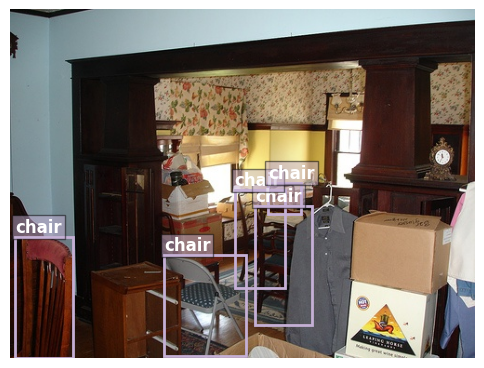

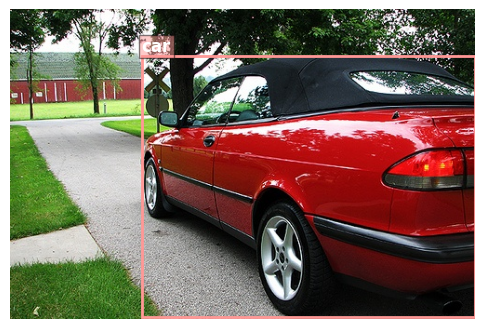

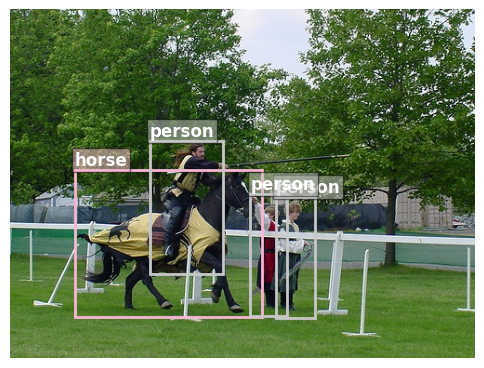

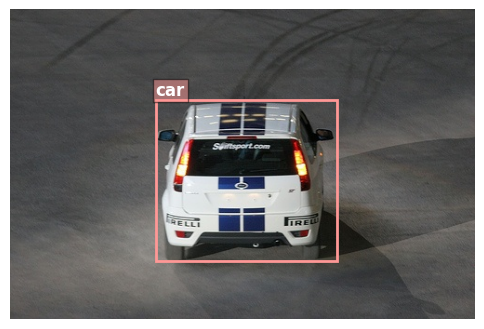

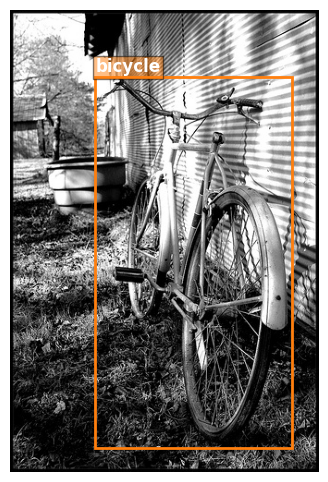

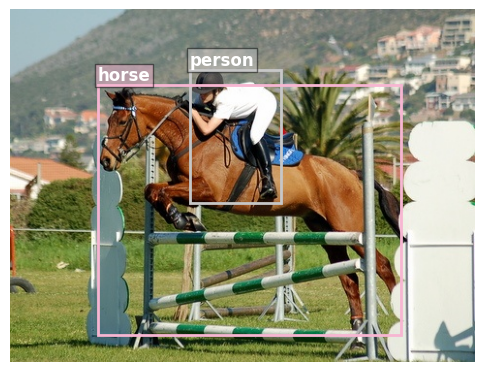

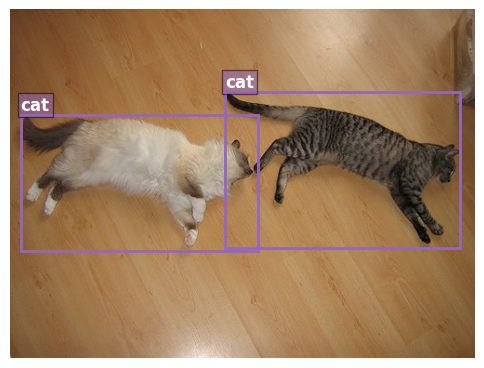

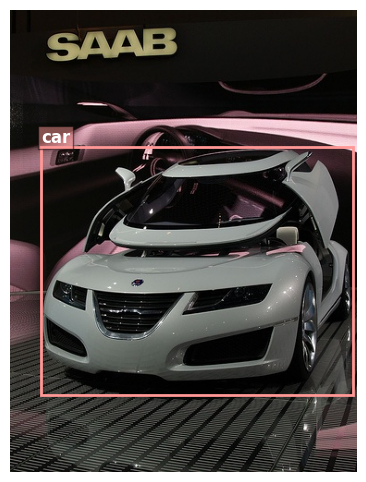

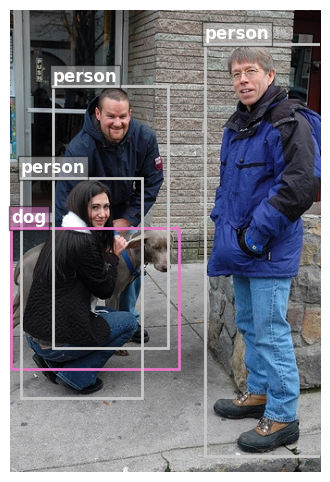

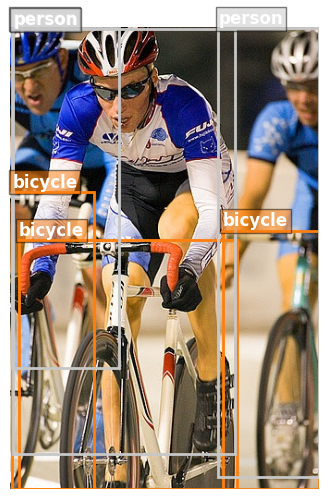

In [5]:
def show_sample(img, info_img):
    if isinstance(img, torch.Tensor):
        img_np = img.permute(1, 2, 0).cpu().numpy()
    else:
        img_np = np.array(img)

    plt.figure(figsize=(6, 6))
    plt.imshow(img_np)

    cmap = plt.get_cmap('tab20')
    ax = plt.gca()

    for obj in info_img["objects"]:
        xmin, ymin, xmax, ymax = obj["bbox"]
        width = xmax - xmin
        height = ymax - ymin

        class_name = obj["label"]
        label_idx = obj["label_idx"]
        color = cmap(label_idx % 20)

        rect = patches.Rectangle(
            (xmin, ymin), width, height,
            linewidth=2, edgecolor=color, facecolor='none'
        )
        ax.add_patch(rect)

        ax.text(
            xmin, ymin - 5, class_name,
            bbox=dict(facecolor=color, alpha=0.5, pad=2),
            fontsize=12, color='white', weight='bold'
        )

    plt.axis('off')
    plt.show()


for i in range(10):
    img, raw_target = dataset[i]
    info_img = extract_info(raw_target)
    show_sample(img, info_img)

## Understanding Anchors

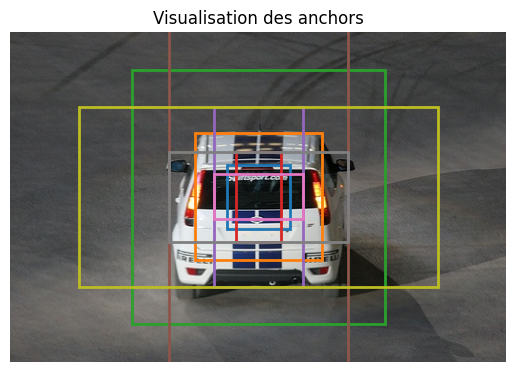

In [6]:
ratios = [1.0, 2.0, 0.5]
pix = [64, 128, 256]

cmap = plt.get_cmap('tab20')
plt.imshow(image1.permute(1, 2, 0).detach().numpy())
plt.axis("off")
plt.title("Visualisation des anchors")
ax = plt.gca()

c = image1.shape[2] // 2, image1.shape[1] // 2  # centre (cx, cy)

idx = 0
for r in ratios:
    for p in pix:
        h = p * np.sqrt(r)
        w = p / np.sqrt(r)
        rect = patches.Rectangle(
            (c[0] - w/2, c[1] - h/2), w, h,
            linewidth=2, edgecolor=cmap((idx*2) % 20), facecolor='none'
        )
        ax.add_patch(rect)
        idx += 1
plt.show()

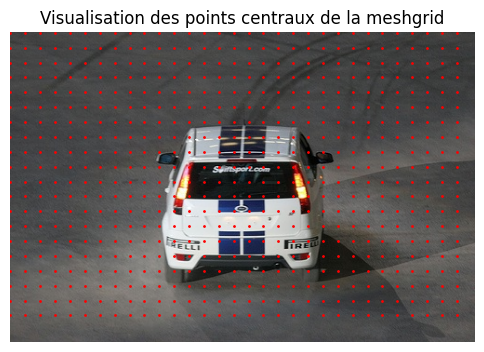

In [7]:
stride = 16

feature_map_width = image1.shape[2] // stride
feature_map_height = image1.shape[1] // stride

shift_x = np.arange(0, feature_map_width) * stride
shift_y = np.arange(0, feature_map_height) * stride

shift_x, shift_y = np.meshgrid(shift_x, shift_y)

plt.figure(figsize=(6, 6))
plt.imshow(image1.permute(1, 2, 0).detach().numpy())
plt.axis("off")
plt.title("Visualisation des points centraux de la meshgrid") # Updated title for clarity
ax = plt.gca()

for x, y in zip(shift_x.flatten(), shift_y.flatten()):
    ax.plot(x, y, 'r.', markersize=2)
plt.show()

In [8]:
def generate_base_anchors(scales, ratios):
    """Retourne un tableau (k, 4) de boxes (x1, y1, x2, y2) centrées en (0,0)."""
    anchors = []
    for r in ratios:
        for p in scales:
            h = p * np.sqrt(r)
            w = p / np.sqrt(r)
            anchors.append([-w/2, -h/2, w/2, h/2])
    return np.array(anchors)

base_anchors = generate_base_anchors(pix, ratios)
shifts = np.stack([shift_x.ravel(), shift_y.ravel(),
                    shift_x.ravel(), shift_y.ravel()], axis=1)
all_anchors = shifts[:, None, :] + base_anchors[None, :, :]
all_anchors.shape

(620, 9, 4)

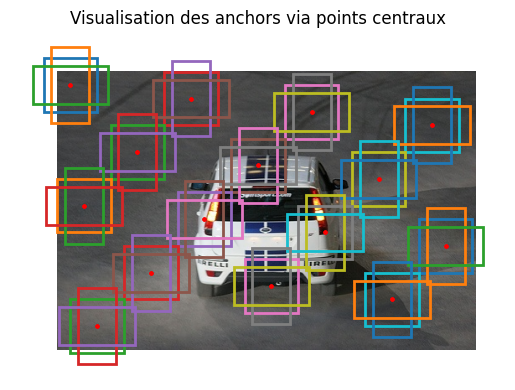

In [9]:
plt.imshow(image1.permute(1, 2, 0).detach().numpy())
plt.axis("off")
plt.title("Visualisation des anchors via points centraux")
ax = plt.gca()

idx = 0
for groupe_anchor in all_anchors[16*2::16*2+8]:
    for anchor in groupe_anchor[[0, 3, 6]]:
        xmin_, ymin_, xmax_, ymax_ = anchor
        width = xmax_ - xmin_
        height = ymax_ - ymin_
        cx = xmin_ + width / 2
        cy = ymin_ + height / 2

        rect = patches.Rectangle(
            (xmin_, ymin_), width, height,
            linewidth=2, edgecolor=cmap((idx * 2) % 20), facecolor='none'
        )
        ax.plot(cx, cy, 'r.', markersize=4)
        ax.add_patch(rect)
        idx += 1


In [10]:
def iou(box1, box2):
    xmin1, ymin1, xmax1, ymax1 = box1
    xmin2, ymin2, xmax2, ymax2 = box2

    area1 = (xmax1 - xmin1) * (ymax1 - ymin1)
    area2 = (xmax2 - xmin2) * (ymax2 - ymin2)

    xmin = np.maximum(xmin1, xmin2)
    ymin = np.maximum(ymin1, ymin2)
    xmax = np.minimum(xmax1, xmax2)
    ymax = np.minimum(ymax1, ymax2)

    h = np.maximum(0, ymax - ymin)
    w = np.maximum(0, xmax - xmin)

    intersection = h * w
    union = area1 + area2 - intersection

    return intersection / union


def filter_anchors(all_anchors, list_gt, low_thresh=0.3, high_thresh=0.7):
    positive_anchors = []
    negative_anchors = []

    for groupe_anchor in all_anchors:
        for anchor in groupe_anchor:
            for gt in list_gt:
                gt_bbox = gt["bbox"]
                iou_ = iou(anchor, gt_bbox)
                if iou_ >= high_thresh:
                    positive_anchors.append(anchor)
                if iou_ <= low_thresh:
                    negative_anchors.append(anchor)

    return positive_anchors, negative_anchors

Number postive anchors : 24
Number negative anchors : 5083


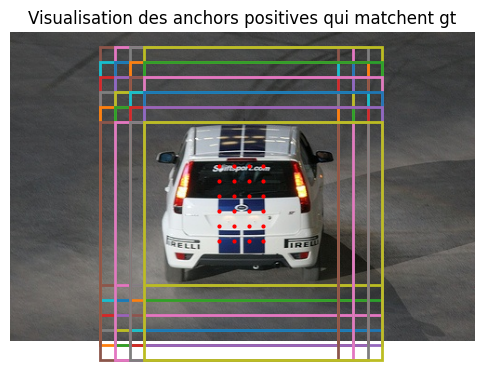

In [11]:
positive_anchors, negative_anchors = filter_anchors(
    all_anchors,
    info1["objects"],
    high_thresh=0.5,
    low_thresh=0.3
)

print(f"Number postive anchors : {len(positive_anchors)}")
print(f"Number negative anchors : {len(negative_anchors)}")

plt.figure(figsize=(6, 6))
plt.imshow(image1.permute(1, 2, 0).detach().numpy())
plt.axis("off")
plt.title("Visualisation des anchors positives qui matchent gt")
ax = plt.gca()

for anchor in positive_anchors:
    xmin, ymin, xmax, ymax = anchor
    width = xmax - xmin
    height = ymax - ymin
    cx = xmin + width / 2
    cy = ymin + height / 2

    rect = patches.Rectangle(
        (xmin, ymin), width, height,
        linewidth=2, edgecolor=cmap((idx * 2) % 20), facecolor='none'
    )

    ax.plot(cx, cy, 'r.', markersize=4)
    ax.add_patch(rect)
    idx += 1

plt.show()

Une version améliorer en matrix pour aller plus vite

In [12]:
def compute_iou_matrix(anchors: torch.Tensor, gt_boxes: torch.Tensor) -> torch.Tensor:
    """
    anchors: (N, 4) sur le device cible
    gt_boxes: (M, 4) sur le même device
    retourne (N, M)
    """
    anchors = anchors.unsqueeze(1)    # (N, 1, 4)
    gt_boxes = gt_boxes.unsqueeze(0)  # (1, M, 4)

    xmin = torch.maximum(anchors[..., 0], gt_boxes[..., 0])
    ymin = torch.maximum(anchors[..., 1], gt_boxes[..., 1])
    xmax = torch.minimum(anchors[..., 2], gt_boxes[..., 2])
    ymax = torch.minimum(anchors[..., 3], gt_boxes[..., 3])

    inter = (xmax - xmin).clamp(min=0) * (ymax - ymin).clamp(min=0)

    area_a = (anchors[..., 2] - anchors[..., 0]) * (anchors[..., 3] - anchors[..., 1])
    area_g = (gt_boxes[..., 2] - gt_boxes[..., 0]) * (gt_boxes[..., 3] - gt_boxes[..., 1])

    return inter / (area_a + area_g - inter)


def assign_targets_to_anchors(all_anchors, list_gt, pos_thresh=0.7, neg_thresh=0.3,
                               device="cuda" if torch.cuda.is_available() else "cpu"):
    anchors = torch.as_tensor(all_anchors, dtype=torch.float32, device=device).reshape(-1, 4)
    gt_boxes = torch.as_tensor([gt["bbox"] for gt in list_gt], dtype=torch.float32, device=device)

    iou_matrix = compute_iou_matrix(anchors, gt_boxes)              # (N, M)
    max_iou_per_anchor, _ = iou_matrix.max(dim=1)

    labels = torch.full((anchors.shape[0],), -1, dtype=torch.long, device=device)
    labels[max_iou_per_anchor >= pos_thresh] = 1
    labels[max_iou_per_anchor < neg_thresh] = 0

    best_anchor_per_gt = iou_matrix.argmax(dim=0)
    labels[best_anchor_per_gt] = 1

    pos_idx = torch.nonzero(labels == 1, as_tuple=True)[0]
    neg_idx = torch.nonzero(labels == 0, as_tuple=True)[0]

    return pos_idx, neg_idx, labels

## Create Dataset

In [13]:
info_dataset = []
for i in tqdm(range(len(dataset))):
    info = extract_info(dataset[i][1])
    obj = {
        "filename" : info["filename"],
        "image_size" : info["image_size"],
    }
    for gt in info["objects"]:
        obj["label"] = gt["label"]
        obj["label_idx"] = gt["label_idx"]
        obj["bbox"] = gt["bbox"]
        info_dataset.append(obj)


  0%|          | 0/5011 [00:00<?, ?it/s]

In [14]:
df = pd.DataFrame(info_dataset)
print(f"Number of data point : {len(df)}")


# pas de shuffle car on veut traiter toutes les memes gt par image
train_split, val_split = int(len(df)*0.8), int(len(df)*0.9)
train_df = df[:train_split]
val_df = df[train_split:val_split]
test_df = df[val_split:]


train_df.head(10)

Number of data point : 15662


,filename,image_size,label,label_idx,bbox
0,000005.jpg,"(500, 375)",chair,9,"(277, 186, 312, 220)"
1,000005.jpg,"(500, 375)",chair,9,"(277, 186, 312, 220)"
2,000005.jpg,"(500, 375)",chair,9,"(277, 186, 312, 220)"
3,000005.jpg,"(500, 375)",chair,9,"(277, 186, 312, 220)"
4,000005.jpg,"(500, 375)",chair,9,"(277, 186, 312, 220)"
5,000007.jpg,"(500, 333)",car,7,"(141, 50, 500, 330)"
6,000009.jpg,"(500, 375)",person,15,"(258, 198, 297, 329)"
7,000009.jpg,"(500, 375)",person,15,"(258, 198, 297, 329)"
8,000009.jpg,"(500, 375)",person,15,"(258, 198, 297, 329)"
9,000009.jpg,"(500, 375)",person,15,"(258, 198, 297, 329)"


In [15]:
def parse_bbox(bbox_value):
    """Gère le cas où bbox est une string 'x1,y1,x2,y2' ou déjà une liste."""
    if isinstance(bbox_value, str):
        return [float(v) for v in bbox_value.split(",")]
    return [float(v) for v in bbox_value]

class VOCRPNDataset(Dataset):
    def __init__(self, df, img_dir, target_size=600, max_size=1000):
        self.img_dir = img_dir
        self.target_size = target_size
        self.max_size = max_size
        self.groups = df.groupby("filename")
        self.filenames = list(self.groups.groups.keys())

    def __len__(self):
        return len(self.filenames)

    def __getitem__(self, idx):
        filename = self.filenames[idx]
        rows = self.groups.get_group(filename)
        image = Image.open(os.path.join(self.img_dir, filename)).convert("RGB")
        orig_w, orig_h = image.size

        boxes = torch.tensor(
            [parse_bbox(b) for b in rows["bbox"]], dtype=torch.float32
        )
        labels = torch.tensor(rows["label_idx"].values, dtype=torch.long)

        scale = min(self.target_size / min(orig_h, orig_w),
                     self.max_size / max(orig_h, orig_w))
        new_h, new_w = int(orig_h * scale), int(orig_w * scale)

        image = image.resize((new_w, new_h))
        image_tensor = transforms.functional.to_tensor(image)

        boxes = boxes * scale

        return {
            "image": image_tensor,
            "boxes": boxes,
            "labels": labels,
        }

def rpn_collate_fn(batch):
    images = [item["image"] for item in batch]
    boxes  = [item["boxes"]  for item in batch]
    labels = [item["labels"] for item in batch]

    max_h = max(img.shape[1] for img in images)
    max_w = max(img.shape[2] for img in images)

    batched_images = torch.zeros(len(images), 3, max_h, max_w)
    for i, img in enumerate(images):
        _, h, w = img.shape
        batched_images[i, :, :h, :w] = img

    return {
        "images": batched_images,
        "boxes":  boxes,
        "labels": labels,
    }

image_dir = "/content/data/VOCdevkit/VOC2007/JPEGImages"
train_dataset = VOCRPNDataset(train_df, image_dir)
val_dataset = VOCRPNDataset(val_df, image_dir)
test_dataset = VOCRPNDataset(test_df, image_dir)

B = 2
def generate_dataloader(dataset, batch_size=4, shuffle=True):
    return DataLoader(dataset, batch_size=batch_size, shuffle=shuffle, collate_fn=rpn_collate_fn)


train_dataloader = generate_dataloader(train_dataset)
val_dataloader = generate_dataloader(train_dataset, shuffle=False)
test_dataloader = generate_dataloader(train_dataset, shuffle=False)

## Model RPN (Region Proprosal Network)

In [16]:
from torchvision.models import vgg16
from torchvision.ops import nms

class RPN(nn.Module):
    def __init__(
        self,
        nb_anchors=9,
        in_channels=512,
    ):
        super(RPN, self).__init__()
        self.backbone = nn.Sequential(
            *list(vgg16(pretrained=True).features.children())[:-1]
        )
        for param in self.backbone.parameters():
            param.requires_grad = False

        self.conv = nn.Conv2d(in_channels, in_channels, kernel_size=3, padding=1)
        self.relu = nn.ReLU()

        self.cls_conv = nn.Conv2d(in_channels, nb_anchors * 2, kernel_size=1)
        self.reg_conv = nn.Conv2d(in_channels, nb_anchors * 4, kernel_size=1)


    def forward(self, x, return_feature=True):
        feature_map = self.backbone(x)
        B = feature_map.shape[0]

        x = self.conv(feature_map)
        x = self.relu(x)

        cls_out = self.cls_conv(x)
        reg_out = self.reg_conv(x)

        cls_out = cls_out.permute(0, 2, 3, 1).reshape(B, -1, 2)
        reg_out = reg_out.permute(0, 2, 3, 1).reshape(B, -1, 4)

        res_dict = {
            "cls_out": cls_out,
            "reg_out": reg_out,
        }

        if return_feature:
            res_dict["feature_map"] = feature_map

        return res_dict


device = "cuda" if torch.cuda.is_available() else "cpu"
rpn = RPN().to(device)

/usr/local/lib/python3.12/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG16_Weights.IMAGENET1K_V1`. You can also use `weights=VGG16_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Downloading: "https://download.pytorch.org/models/vgg16-397923af.pth" to /root/.cache/torch/hub/checkpoints/vgg16-397923af.pth


100%|██████████| 528M/528M [00:05<00:00, 92.8MB/s]


In [17]:
batch_sample = next(iter(train_dataloader))
image = batch_sample["images"].to(device)
boxes = batch_sample["boxes"]
labels = batch_sample["labels"]
print(f"Type of boxe : {type(boxes)}")
print(f"Type of boxe[0] : {type(boxes[0])}")
print(f"Image shape : {image.shape}")
print(f"Number Boxes  : {len(boxes)}")
print(f"Number Boxes  : {boxes[0].shape}")
print(f"Labels shape : {len(labels)}")
print(f"Labels shape : {labels[0].shape}")


res_rpn = rpn(image, return_feature=False)
cls = res_rpn.get("cls_out")
reg = res_rpn.get("reg_out")
feature_map = res_rpn.get("feature_map")

print(f"Feature map cls shape : {cls.shape}")
print(f"Feature map reg shape : {reg.shape}")
if feature_map is not None:
  print(f"Feature map backbone shape : {feature_map.shape}")

Type of boxe : <class 'list'>
Type of boxe[0] : <class 'torch.Tensor'>
Image shape : torch.Size([4, 3, 600, 800])
Number Boxes  : 4
Number Boxes  : torch.Size([1, 4])
Labels shape : 4
Labels shape : torch.Size([1])
Feature map cls shape : torch.Size([4, 16650, 2])
Feature map reg shape : torch.Size([4, 16650, 4])


### Ground Truth Generator

In [18]:
class GroundTruthGenerator:
    def __init__(
        self,
        scales=[0.5, 1.0, 2.0],
        pix=[64, 128, 256],
        stride=16,
        device="cuda"
    ):
        self.device = device
        self.stride = stride
        self.base_anchors = self._generate_base_anchors(scales, pix)  # (k, 4) — calculé une fois

    def _generate_base_anchors(self, scales, pix):
        """
        Génère les k anchors centrées en (0,0).
        scales : ratios h/w  — ex. [0.5, 1.0, 2.0]
        pix    : tailles     — ex. [64, 128, 256]
        retourne (k, 4) en (xmin, ymin, xmax, ymax)
        """
        anchors = []
        for r in scales:
            for p in pix:
                h = p * (r ** 0.5)
                w = p / (r ** 0.5)
                anchors.append([-w/2, -h/2, w/2, h/2])
        return torch.tensor(anchors, dtype=torch.float32, device=self.device)  # (k, 4)

    def generate_all_anchors(self, fmap_h, fmap_w):
        """
        Translate les base_anchors sur toute la grille.
        Appelée à chaque batch car fmap_h/fmap_w varient selon le padding.
        retourne (fmap_h * fmap_w * k, 4)
        """
        shift_x = torch.arange(0, fmap_w, device=self.device) * self.stride
        shift_y = torch.arange(0, fmap_h, device=self.device) * self.stride
        shift_y, shift_x = torch.meshgrid(shift_y, shift_x, indexing="ij")

        shifts = torch.stack([
            shift_x.ravel(), shift_y.ravel(),
            shift_x.ravel(), shift_y.ravel()
        ], dim=1)  # (N, 4)  N = fmap_h * fmap_w

        # (N, 1, 4) + (1, k, 4) → (N, k, 4) → (N*k, 4)
        all_anchors = (shifts[:, None, :] + self.base_anchors[None, :, :])
        return all_anchors.reshape(-1, 4)

    def _compute_iou_matrix(self, anchors, gt_boxes):
        anchors  = anchors.unsqueeze(1)
        gt_boxes = gt_boxes.unsqueeze(0)

        xmin = torch.maximum(anchors[..., 0], gt_boxes[..., 0])
        ymin = torch.maximum(anchors[..., 1], gt_boxes[..., 1])
        xmax = torch.minimum(anchors[..., 2], gt_boxes[..., 2])
        ymax = torch.minimum(anchors[..., 3], gt_boxes[..., 3])

        inter = (xmax - xmin).clamp(min=0) * (ymax - ymin).clamp(min=0)
        area_a = (anchors[...,2]-anchors[...,0]) * (anchors[...,3]-anchors[...,1])
        area_g = (gt_boxes[...,2]-gt_boxes[...,0]) * (gt_boxes[...,3]-gt_boxes[...,1])

        return inter / (area_a + area_g - inter)

    def assign_targets_to_anchors(self, anchors, gt_boxes, pos_thresh=0.7, neg_thresh=0.3):
        anchors  = anchors.reshape(-1, 4).to(self.device)
        gt_boxes = gt_boxes.to(self.device)

        iou_matrix = self._compute_iou_matrix(anchors, gt_boxes)
        max_iou_per_anchor, matched_gt_idx = iou_matrix.max(dim=1)

        labels = torch.full((anchors.shape[0],), -1, dtype=torch.long, device=self.device)
        labels[max_iou_per_anchor >= pos_thresh] = 1
        labels[max_iou_per_anchor <  neg_thresh] = 0

        best_anchor_per_gt = iou_matrix.argmax(dim=0)
        labels[best_anchor_per_gt] = 1

        pos_idx = torch.nonzero(labels == 1, as_tuple=True)[0]
        neg_idx = torch.nonzero(labels == 0, as_tuple=True)[0]

        return pos_idx, neg_idx, labels, matched_gt_idx

    def __call__(self, fmap_h, fmap_w, gt_boxes, n_sample=256, pos_ratio=0.5):
        all_anchors = self.generate_all_anchors(fmap_h, fmap_w)

        pos_idx, neg_idx, labels, matched_gt_idx = self.assign_targets_to_anchors(
            all_anchors, gt_boxes
        )

        n_pos = int(n_sample * pos_ratio)
        perm_pos = torch.randperm(len(pos_idx), device=self.device)
        perm_neg = torch.randperm(len(neg_idx), device=self.device)

        sampled_pos = pos_idx[perm_pos[:n_pos]]
        sampled_neg = neg_idx[perm_neg[:n_sample - len(sampled_pos)]]

        sampled_idx    = torch.cat([sampled_pos, sampled_neg])
        sampled_labels = labels[sampled_idx]

        return all_anchors, sampled_idx, sampled_labels, matched_gt_idx

### Train RPN

In [19]:
def compute_reg_targets(anchors, gt_boxes):
    """
    anchors  : (N, 4) — xmin ymin xmax ymax
    gt_boxes : (N, 4) — la GT box matchée pour chaque anchor positif
    retourne : (N, 4) — tx ty tw th
    """
    # conversion en format centre
    wa = anchors[:, 2] - anchors[:, 0]
    ha = anchors[:, 3] - anchors[:, 1]
    cxa = anchors[:, 0] + 0.5 * wa
    cya = anchors[:, 1] + 0.5 * ha

    wg = gt_boxes[:, 2] - gt_boxes[:, 0]
    hg = gt_boxes[:, 3] - gt_boxes[:, 1]
    cxg = gt_boxes[:, 0] + 0.5 * wg
    cyg = gt_boxes[:, 1] + 0.5 * hg

    tx = (cxg - cxa) / wa
    ty = (cyg - cya) / ha
    tw = torch.log(wg / wa)
    th = torch.log(hg / ha)

    return torch.stack([tx, ty, tw, th], dim=1)  # (N, 4)


epochs = 15
device = "cuda" if torch.cuda.is_available() else "cpu"
rpn = RPN().to(device)
optimizer = torch.optim.Adam(rpn.parameters(), lr=1e-3)
loss_fn_cls = nn.CrossEntropyLoss()
loss_fn_reg = nn.SmoothL1Loss()

rpn_losses = []
gt_bbox_generator = GroundTruthGenerator(device=device)

for epoch in tqdm(range(epochs)):
    batch_loss = []
    for batch in train_dataloader:
        images = batch["images"].to(device)
        bboxes = batch["boxes"]

        res_rpn = rpn(images, return_feature=True)
        cls = res_rpn["cls_out"]
        reg = res_rpn["reg_out"]
        feature_map  = res_rpn["feature_map"]
        fmap_h, fmap_w = feature_map.shape[2:]

        total_loss = torch.tensor(0.0, device=device)

        for i, gt_boxes in enumerate(bboxes):
            gt_boxes = gt_boxes.to(device)

            # 1. générer anchors + échantillonnage
            all_anchors, sampled_idx, sampled_labels, matched_gt_idx = gt_bbox_generator(
                fmap_h, fmap_w, gt_boxes
            )

            # 2. loss cls — sur les 256 anchors samplés
            cls_pred = cls[i][sampled_idx]           # (256, 2)
            loss_cls = loss_fn_cls(cls_pred, sampled_labels)

            # 3. loss reg — uniquement sur les positifs
            pos_mask = sampled_labels == 1
            pos_idx = sampled_idx[pos_mask]

            if len(pos_idx) > 0:
                reg_pred = reg[i][pos_idx]
                matched_gt = gt_boxes[matched_gt_idx[pos_idx]]
                reg_targets = compute_reg_targets(
                    all_anchors[pos_idx], matched_gt
                )
                loss_reg = loss_fn_reg(reg_pred, reg_targets)
            else:
                loss_reg = torch.tensor(0.0, device=device)

            total_loss += loss_cls + loss_reg

        total_loss = total_loss / len(bboxes)

        optimizer.zero_grad()
        total_loss.backward()
        optimizer.step()

        batch_loss.append(total_loss.item())

    print(f"Epoch {epoch+1}/{epochs} : {np.mean(batch_loss):.4f}")
    rpn_losses.append(np.mean(batch_loss))

  0%|          | 0/15 [00:00<?, ?it/s]

Epoch 1/15 : 0.1168
Epoch 2/15 : 0.0778
Epoch 3/15 : 0.0709
Epoch 4/15 : 0.0623
Epoch 5/15 : 0.0550
Epoch 6/15 : 0.0502
Epoch 7/15 : 0.0438
Epoch 8/15 : 0.0405
Epoch 9/15 : 0.0374
Epoch 10/15 : 0.0327
Epoch 11/15 : 0.0297
Epoch 12/15 : 0.0281
Epoch 13/15 : 0.0258
Epoch 14/15 : 0.0239
Epoch 15/15 : 0.0232


### RPN Inférence

In [20]:
class RPNInference:
    def __init__(
        self,
        rpn: RPN,
        scales=[0.5, 1.0, 2.0],
        pix=[64, 128, 256],
        stride=16,
        n_pre_nms=6000,
        n_post_nms=300,
        nms_thresh=0.7,
        score_thresh=0.5,
        device="cuda"
    ):
        self.rpn = rpn
        self.stride = stride
        self.n_pre_nms = n_pre_nms
        self.n_post_nms = n_post_nms
        self.nms_thresh = nms_thresh
        self.score_thresh = score_thresh
        self.device = device
        self.base_anchors = self._generate_base_anchors(scales, pix)  # (k, 4)

    def _generate_base_anchors(self, scales, pix):
        """k anchors centrées en (0,0) — calculées une seule fois."""
        anchors = []
        for r in scales:
            for p in pix:
                h = p * (r ** 0.5)
                w = p / (r ** 0.5)
                anchors.append([-w/2, -h/2, w/2, h/2])
        return torch.tensor(anchors, dtype=torch.float32, device=self.device)

    def generate_all_anchors(self, fmap_h, fmap_w):
        """
        Translate les base_anchors sur toute la grille de la feature map.
        retourne : (fmap_h * fmap_w * k, 4)
        """
        shift_x = torch.arange(0, fmap_w, device=self.device) * self.stride
        shift_y = torch.arange(0, fmap_h, device=self.device) * self.stride
        shift_y, shift_x = torch.meshgrid(shift_y, shift_x, indexing="ij")

        shifts = torch.stack([
            shift_x.ravel(), shift_y.ravel(),
            shift_x.ravel(), shift_y.ravel()
        ], dim=1)                                         # (N, 4)

        all_anchors = shifts[:, None, :] + self.base_anchors[None, :, :]
        return all_anchors.reshape(-1, 4)                 # (N*k, 4)


    @torch.no_grad()
    def _run_rpn(self, image):
        """
        image : (1, 3, H, W) tensor sur device
        retourne cls_scores (N*k,), reg_deltas (N*k, 4), fmap_h, fmap_w
        """
        self.rpn.eval()
        res = self.rpn(image, return_feature=True)
        cls_out = res["cls_out"]
        reg_out = res["reg_out"]
        fmap_h, fmap_w = res["feature_map"].shape[2:]

        cls_scores = torch.softmax(cls_out[0], dim=-1)[:, 1]
        reg_deltas = reg_out[0]

        return cls_scores, reg_deltas, fmap_h, fmap_w

    def _decode_boxes(self, anchors, deltas):
        """
        Applique les deltas (tx, ty, tw, th) prédits aux anchors
        pour reconstruire les boxes en coordonnées image.

        anchors : (N, 4) — xmin ymin xmax ymax
        deltas  : (N, 4) — tx ty tw th
        retourne : (N, 4) — boxes reconstruites en xmin ymin xmax ymax
        """
        wa  = anchors[:, 2] - anchors[:, 0]
        ha  = anchors[:, 3] - anchors[:, 1]
        cxa = anchors[:, 0] + 0.5 * wa
        cya = anchors[:, 1] + 0.5 * ha

        tx, ty, tw, th = deltas[:, 0], deltas[:, 1], deltas[:, 2], deltas[:, 3]

        # formule inverse de compute_reg_targets
        cx_pred = tx * wa  + cxa
        cy_pred = ty * ha  + cya
        w_pred  = torch.exp(tw) * wa
        h_pred  = torch.exp(th) * ha

        # retour en (xmin, ymin, xmax, ymax)
        boxes = torch.stack([
            cx_pred - 0.5 * w_pred,
            cy_pred - 0.5 * h_pred,
            cx_pred + 0.5 * w_pred,
            cy_pred + 0.5 * h_pred,
        ], dim=1)

        return boxes

    def _clip_boxes(self, boxes, img_h, img_w):
        """Clip les boxes pour qu'elles restent dans les bords de l'image."""
        boxes[:, 0].clamp_(min=0, max=img_w)  # xmin
        boxes[:, 1].clamp_(min=0, max=img_h)  # ymin
        boxes[:, 2].clamp_(min=0, max=img_w)  # xmax
        boxes[:, 3].clamp_(min=0, max=img_h)  # ymax
        return boxes


    def __call__(self, image):
        """
        image : (1, 3, H, W) tensor sur device
        retourne : proposals (M, 4), scores (M,)
            M ≤ n_post_nms
        """
        _, _, img_h, img_w = image.shape

        cls_scores, reg_deltas, fmap_h, fmap_w = self._run_rpn(image)
        all_anchors = self.generate_all_anchors(fmap_h, fmap_w)  # (N*k, 4)

        proposals = self._decode_boxes(all_anchors, reg_deltas)   # (N*k, 4)
        proposals = self._clip_boxes(proposals, img_h, img_w)

        order = cls_scores.argsort(descending=True)
        order = order[:self.n_pre_nms]
        proposals = proposals[order]
        cls_scores = cls_scores[order]

        keep = cls_scores >= self.score_thresh
        proposals = proposals[keep]
        cls_scores = cls_scores[keep]

        keep_idx = nms(proposals, cls_scores, self.nms_thresh)
        keep_idx = keep_idx[:self.n_post_nms]

        return proposals[keep_idx], cls_scores[keep_idx]

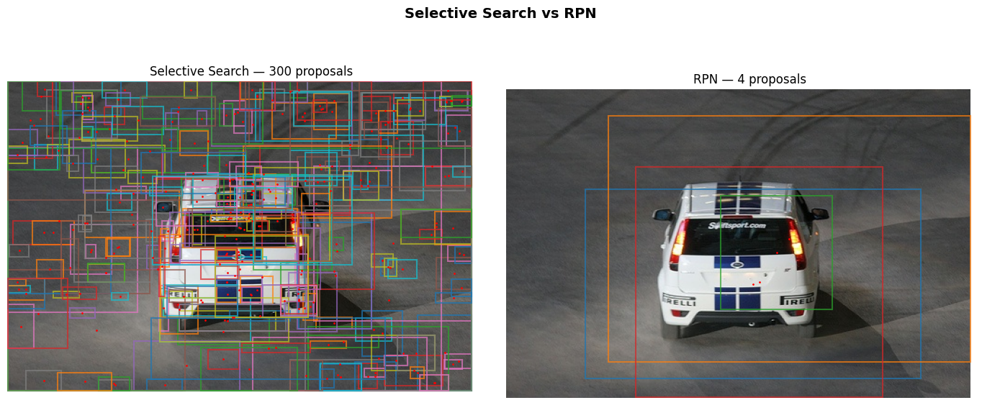

In [33]:
def run_selective_search(image_tensor, n_proposals=300):
    """
    image_tensor : (3, H, W) tensor, valeurs [0, 1]
    retourne     : (N, 4) numpy array — xmin ymin xmax ymax
    """
    img_np = (image_tensor.permute(1, 2, 0).numpy() * 255).astype(np.uint8)
    img_bgr = cv2.cvtColor(img_np, cv2.COLOR_RGB2BGR)

    ss = cv2.ximgproc.segmentation.createSelectiveSearchSegmentation()
    ss.setBaseImage(img_bgr)
    ss.switchToSelectiveSearchFast()
    rects = ss.process()  # format (x, y, w, h)

    boxes = np.array([
        [x, y, x + w, y + h] for x, y, w, h in rects[:n_proposals]
    ])
    return boxes



rpn_proposals = proposals[cls_scores > 0.5].cpu().numpy()
ss_proposals = run_selective_search(image1)

fig, axes = plt.subplots(1, 2, figsize=(14, 6))
img_np = image1.permute(1, 2, 0).detach().numpy()

titles = [
    f"Selective Search — {len(ss_proposals)} proposals",
    f"RPN — {len(rpn_proposals)} proposals",
]
proposals_list = [ss_proposals, rpn_proposals]

for ax, title, props in zip(axes, titles, proposals_list):
    ax.imshow(img_np)
    ax.axis("off")
    ax.set_title(title, fontsize=12)

    for idx, box in enumerate(props):
        xmin, ymin, xmax, ymax = box
        width  = xmax - xmin
        height = ymax - ymin
        cx     = xmin + width  / 2
        cy     = ymin + height / 2

        rect = patches.Rectangle(
            (xmin, ymin), width, height,
            linewidth=1.5,
            edgecolor=cmap((idx * 2) % 20),
            facecolor='none',
            alpha=0.7
        )
        ax.add_patch(rect)
        ax.plot(cx, cy, 'r.', markersize=2)

plt.suptitle("Selective Search vs RPN", fontsize=14, fontweight='bold', y=1.02)
plt.tight_layout()
plt.show()

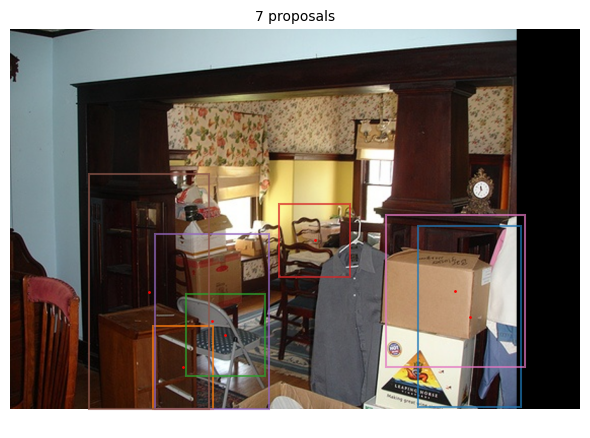

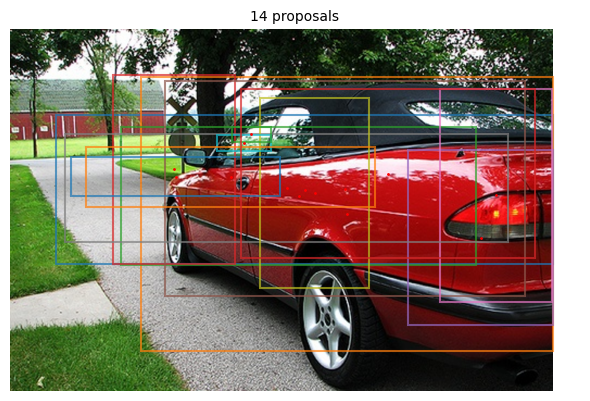

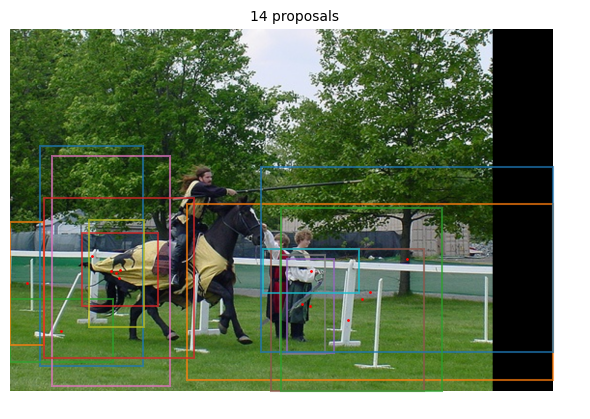

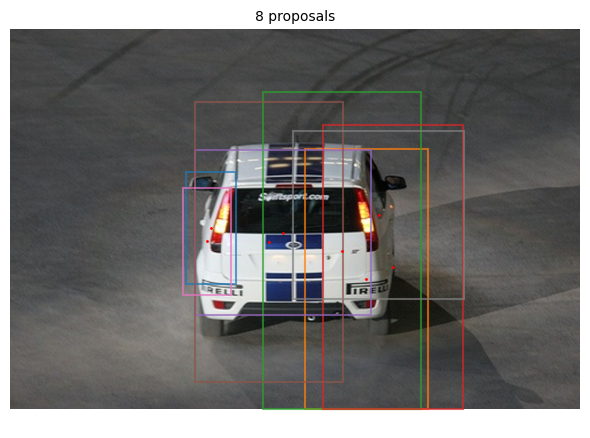

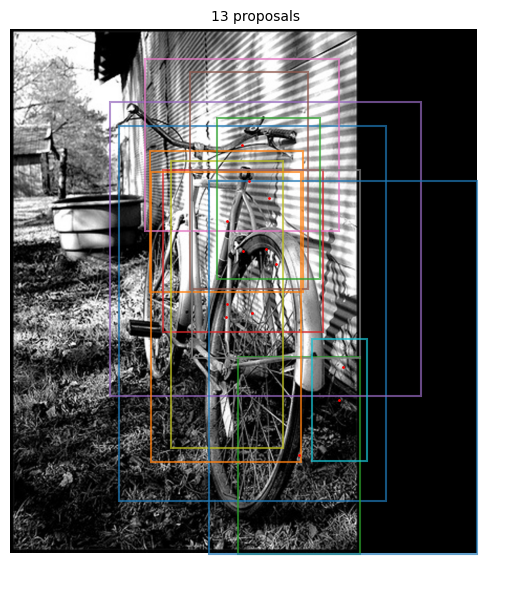

...

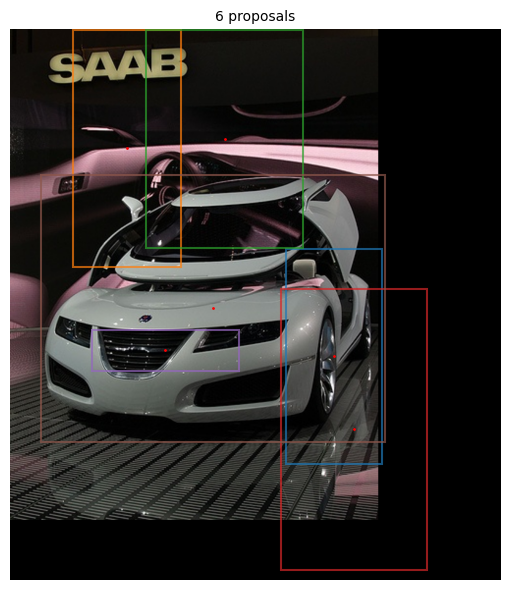

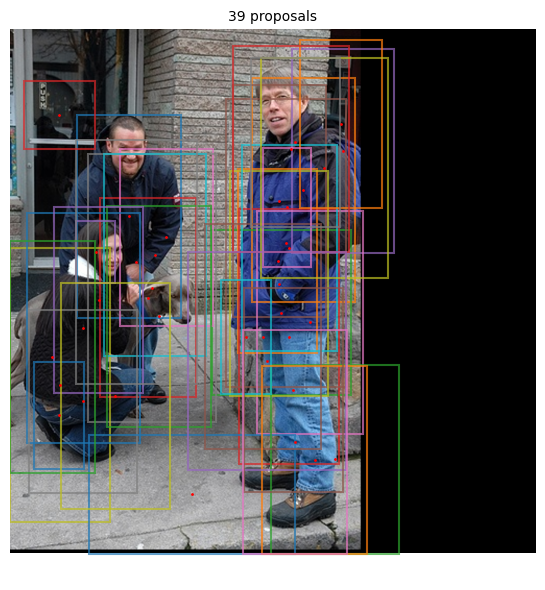

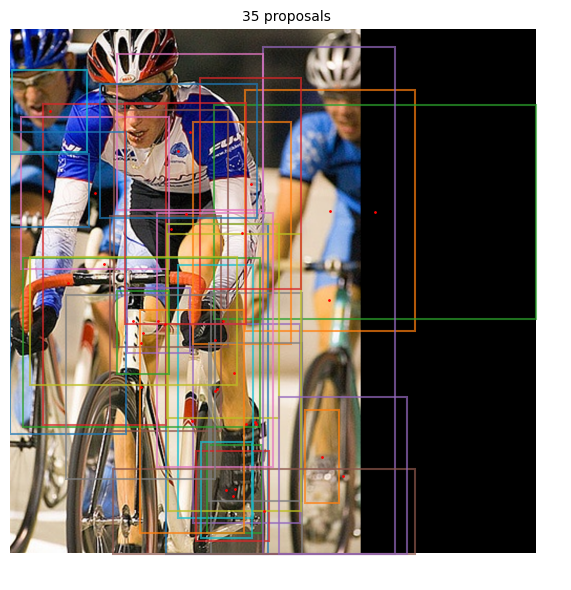

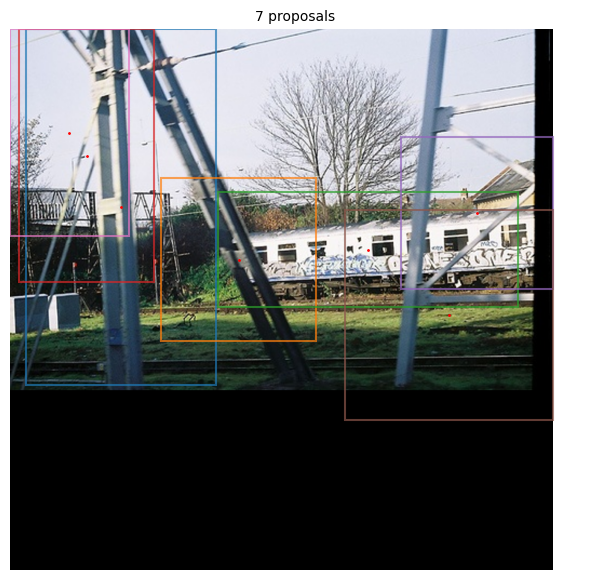

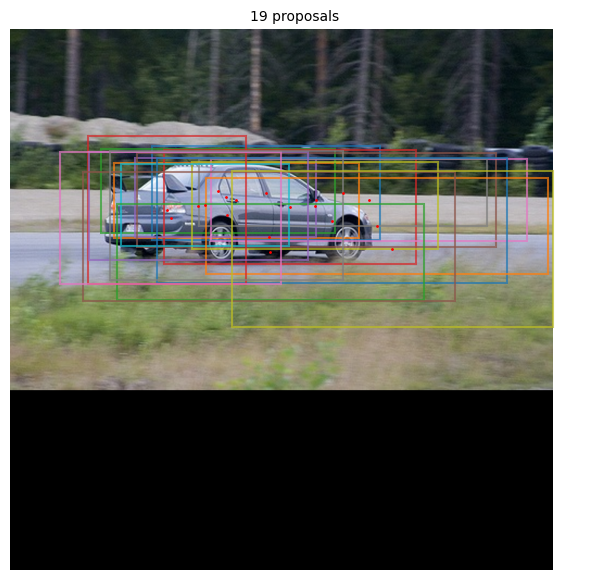

In [47]:
iter_dataloader = iter(test_dataloader)
for i in range(3):
  batch_test = next(iter_dataloader)["images"]

  for img in batch_test:
      proposals, cls_scores = rpn_inference(img.unsqueeze(0).to(device))

      rpn_proposals = proposals[cls_scores > 0.5].cpu().numpy()

      fig, ax = plt.subplots(figsize=(6, 6))
      img_np = img.permute(1, 2, 0).detach().numpy()
      ax.imshow(img_np)
      ax.axis("off")

      for idx, box in enumerate(rpn_proposals):
          xmin, ymin, xmax, ymax = box
          width  = xmax - xmin
          height = ymax - ymin
          rect = patches.Rectangle(
              (xmin, ymin), width, height,
              linewidth=1.5,
              edgecolor=cmap((idx * 2) % 20),
              facecolor='none',
              alpha=0.7
          )
          ax.add_patch(rect)
          ax.plot(xmin + width/2, ymin + height/2, 'r.', markersize=2)

      ax.set_title(f"{len(rpn_proposals)} proposals", fontsize=10)
      plt.tight_layout()
      plt.show()